# Sheet properties

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
%matplotlib inline
# produce vector inline graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')
import matplotlib.pyplot as plt

# Start with local

In [4]:
import sys
from IPython.display import HTML
sys.path.append('/home/rcendre/classification')

In [5]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID";
os.environ["CUDA_VISIBLE_DEVICES"]="1";  

# Imports

In [6]:
import os
import sys
import itertools
import webbrowser
from pathlib import Path
import matplotlib.pyplot as plt
from numpy import array, logspace
from scipy.stats import randint as randint
from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import davies_bouldin_score
from toolbox.classification.common import Folds, IO, Tools
from toolbox.classification.parameters import Dermatology, Settings
from toolbox.models.builtin import Applications
from toolbox.IO import dermatology
from toolbox.transforms.common import PredictorTransform
from toolbox.transforms.labels import OrderedEncoder
from toolbox.transforms.images import DistributionImageTransform, DWTImageTransform, FourierImageTransform, HaralickImageTransform, SpatialImageTransform
from toolbox.views.common import Views, ViewsTools
from toolbox.views.images import ImagesViews
from IPython.display import display
from toolbox.classification.parameters import Dermatology, Settings, LocalParameters

Using TensorFlow backend.


# Parameters

In [7]:
# Advanced parameters
use_unknown = False 
data_type = 'Full'
validation = 4
settings = Settings.get_default_dermatology()

# Inputs

In [8]:
inputs = Dermatology.images(modality='Microscopy', data_type=data_type)

# Feature extraction

In [9]:
features_file = f'Transfer_Full.pickle'

In [10]:
architectures = [('VGG16', {}), ('InceptionV3', {}), ('InceptionResNetV2', {}), ('ResNet', {})]

In [11]:
for architecture in architectures:
    architecture_name = architecture[0]
    architecture_additional = architecture[1]
    # Extracting
    method = Applications.get_transfer_learning(architecture=architecture_name, pooling='avg', batch_size=1, additional=architecture_additional)
    method.transform = method.predict_proba
    Tools.transform(inputs, {'datum': 'Datum'}, method, f'{architecture_name}Avg')

    # Extracting
    method = Applications.get_transfer_learning(architecture=architecture_name, pooling='max', batch_size=1, additional=architecture_additional)
    method.transform = method.predict_proba
    Tools.transform(inputs, {'datum': 'Datum'}, method, f'{architecture_name}Max')
    
    # Save    
    IO.save(inputs, features_file)

Found 5431 images.
Found 5431 images.
Found 5431 images.
Found 5431 images.
Found 5431 images.
Found 5431 images.
A local file was found, but it seems to be incomplete or outdated because the auto file hash does not match the original value of 4d473c1dd8becc155b73f8504c6f6626 so we will re-download the data.
94773248/94765736 [==============================] - 36s 0us/step
Found 5431 images.
Found 5431 images.


# Label / Group / Fold

In [12]:
# Transform groups
group_encoder = LabelEncoder().fit(array(inputs['ID_Patient'].tolist()))
Tools.transform(inputs, {'datum': 'ID_Patient'}, group_encoder, 'GroupEncode')
# Transform labels
label_encoder = OrderedEncoder().fit(['Normal', 'Benign', 'Malignant'])
Tools.transform(inputs, {'datum': 'Label'}, label_encoder, 'LabelEncode')
pathological_encoder = OrderedEncoder().fit(['Normal', 'Pathological'])
Tools.transform(inputs, {'datum': 'Pathological'}, pathological_encoder, 'PathologicalEncode')
malignant_encoder = OrderedEncoder().fit(['Rest', 'Malignant'])
Tools.transform(inputs, {'datum': 'Malignant'}, malignant_encoder, 'MalignantEncode')
# Make folds
Folds.build_group_folds(inputs, {'datum': 'Datum', 'label_encode': 'LabelEncode', 'group': 'GroupEncode'}, validation)
IO.save(inputs, features_file)

# Features

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

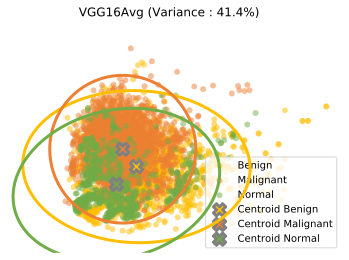

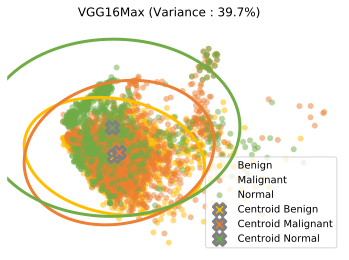

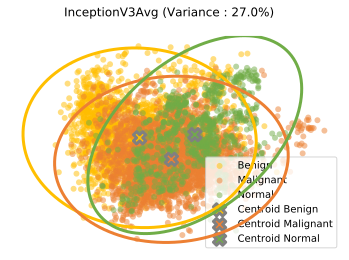

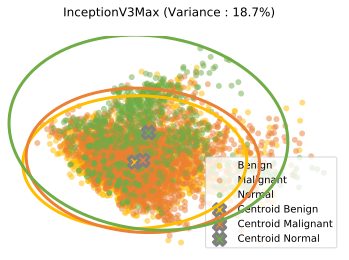

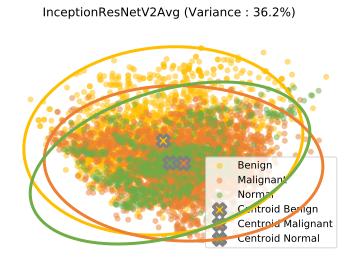

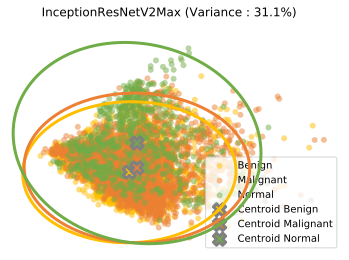

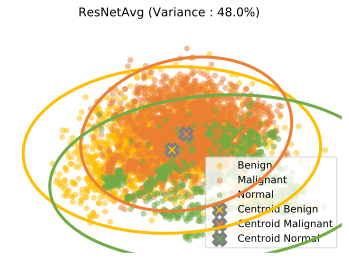

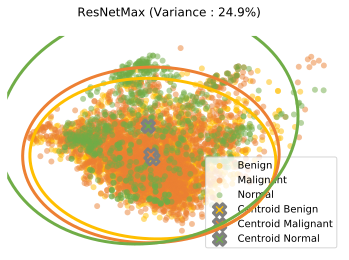

In [13]:
inputs = IO.load(features_file)
for architecture in architectures: 
    extractor_name, extractor_process = architecture
    # PCA + TSNE
    figure = Views.projection(inputs, {'datum': f'{extractor_name}Avg', 'label': 'Label'}, settings);
    figure.savefig(f"{extractor_name}Avg.png", bbox_inches='tight', dpi=300)
    
    figure = Views.projection(inputs, {'datum': f'{extractor_name}Max', 'label': 'Label'}, settings);
    figure.savefig(f"{extractor_name}Max.png", bbox_inches='tight', dpi=300)